<a href="https://colab.research.google.com/github/bermudezfc/CCADMACL_EXERCISES_COM222ML/blob/main/Exercise6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Exercise 6

Netflix is the world's largest online streaming service provider, with over 220 million subscribers. It is crucial that they effectively cluster the shows that are hosted on their platform in order to enhance the user experience, thereby preventing subscribers from ending their subscription.

We will be able to understand the shows that are similar to and different from one another by creating clusters, which may be leveraged to offer the consumers personalized show suggestions depending on their preferences.

## Instructions

1. Your task is to group the Netflix shows into certain clusters such that the shows within a cluster are similar to each other and the shows in different clusters are dissimilar to each other. Use Principal Component Analysis and any Clustering Algorithm.

2. After creating the clusters, profile each cluster that you have created.

In [2128]:
import pandas as pd

In [2129]:
df = pd.read_csv("https://github.com/robitussin/CCADMACL_EXERCISES/blob/353cd84703a9e313ee7ecf37fb97a067aa81ddbc/netflix.csv?raw=true")

In [2130]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       7787 non-null   object
 1   type          7787 non-null   object
 2   title         7787 non-null   object
 3   director      5398 non-null   object
 4   cast          7069 non-null   object
 5   country       7280 non-null   object
 6   date_added    7777 non-null   object
 7   release_year  7787 non-null   int64 
 8   rating        7780 non-null   object
 9   duration      7787 non-null   object
 10  listed_in     7787 non-null   object
 11  description   7787 non-null   object
dtypes: int64(1), object(11)
memory usage: 730.2+ KB


In [2131]:
df.head(10)

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...
5,s6,TV Show,46,Serdar Akar,"Erdal Beşikçioğlu, Yasemin Allen, Melis Birkan...",Turkey,"July 1, 2017",2016,TV-MA,1 Season,"International TV Shows, TV Dramas, TV Mysteries",A genetics professor experiments with a treatm...
6,s7,Movie,122,Yasir Al Yasiri,"Amina Khalil, Ahmed Dawood, Tarek Lotfy, Ahmed...",Egypt,"June 1, 2020",2019,TV-MA,95 min,"Horror Movies, International Movies","After an awful accident, a couple admitted to ..."
7,s8,Movie,187,Kevin Reynolds,"Samuel L. Jackson, John Heard, Kelly Rowan, Cl...",United States,"November 1, 2019",1997,R,119 min,Dramas,After one of his high school students attacks ...
8,s9,Movie,706,Shravan Kumar,"Divya Dutta, Atul Kulkarni, Mohan Agashe, Anup...",India,"April 1, 2019",2019,TV-14,118 min,"Horror Movies, International Movies","When a doctor goes missing, his psychiatrist w..."
9,s10,Movie,1920,Vikram Bhatt,"Rajneesh Duggal, Adah Sharma, Indraneil Sengup...",India,"December 15, 2017",2008,TV-MA,143 min,"Horror Movies, International Movies, Thrillers",An architect and his wife move into a castle t...


In [2132]:
df.sample(10)

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
4756,s4757,Movie,Pants on Fire,Jonathan A. Rosenbaum,"Bradley Steven Perry, Joshua J. Ballard, Tyrel...",Canada,"March 1, 2019",2014,TV-G,87 min,"Children & Family Movies, Comedies",Jealous girlfriends and aliens are just some o...
4055,s4056,TV Show,Metallica: Some Kind of Monster,"Joe Berlinger, Bruce Sinofsky","James Hetfield, Lars Ulrich, Kirk Hammett, Rob...",United States,"February 10, 2017",2014,TV-MA,1 Season,TV Shows,This collection includes the acclaimed rock do...
4799,s4800,Movie,Paul Blart: Mall Cop,Steve Carr,"Kevin James, Keir O'Donnell, Jayma Mays, Raini...",United States,"November 1, 2020",2009,PG,91 min,"Action & Adventure, Comedies",An overzealous security guard finds himself in...
5974,s5975,TV Show,Talking Tom and Friends,NaN,"Colin Hanks, Tom Kenny, James Adomian, Lisa Sc...",Cyprus,"February 15, 2020",2017,TV-Y,1 Season,"Kids' TV, TV Comedies",Full of funny one-liners and always ready for ...
4608,s4609,Movie,Om Shanti Om,Farah Khan,"Shah Rukh Khan, Deepika Padukone, Shreyas Talp...",India,"April 1, 2018",2007,TV-14,169 min,"Comedies, Dramas, International Movies",Reincarnated 30 years after being killed in a ...
7215,s7216,Movie,Trevor Noah: Afraid of the Dark,David Paul Meyer,Trevor Noah,United States,"February 21, 2017",2017,TV-14,67 min,Stand-Up Comedy,"The ""Daily Show"" host ponders the perils of na..."
3684,s3685,TV Show,Living Undocumented,NaN,NaN,United States,"October 2, 2019",2019,TV-MA,1 Season,Docuseries,Eight undocumented families' fates roller-coas...
5306,s5307,Movie,Running Shaadi,Amit Roy,"Amit Sadh, Tapsee Pannu, Arsh Bajwa, Brijendra...",India,"April 30, 2018",2017,TV-14,115 min,"Comedies, International Movies, Romantic Movies",A Bihari migrant runs a successful service to ...
969,s970,Movie,Blackway,Daniel Alfredson,"Anthony Hopkins, Julia Stiles, Alexander Ludwi...",United States,"December 15, 2017",2015,PG-13,90 min,Thrillers,Menaced by a psychopath who's got the local co...
1711,s1712,TV Show,Designated Survivor,NaN,"Kiefer Sutherland, Natascha McElhone, Maggie Q...",United States,"June 7, 2019",2019,TV-MA,3 Seasons,"Crime TV Shows, TV Dramas, TV Thrillers",America's fate rests in the hands of a low-lev...


In [2133]:
pd.options.display.max_rows = None
print(df["listed_in"].value_counts())


listed_in
Documentaries                                                                      334
Stand-Up Comedy                                                                    321
Dramas, International Movies                                                       320
Comedies, Dramas, International Movies                                             243
Dramas, Independent Movies, International Movies                                   215
Kids' TV                                                                           205
Children & Family Movies                                                           177
Documentaries, International Movies                                                172
Children & Family Movies, Comedies                                                 169
Comedies, International Movies                                                     161
Dramas, International Movies, Romantic Movies                                      153
Comedies, International Movies, R

In [2134]:
print(df["rating"].value_counts())


rating
TV-MA       2863
TV-14       1931
TV-PG        806
R            665
PG-13        386
TV-Y         280
TV-Y7        271
PG           247
TV-G         194
NR            84
G             39
TV-Y7-FV       6
UR             5
NC-17          3
Name: count, dtype: int64


In [2135]:
print(df.isnull().sum())

show_id            0
type               0
title              0
director        2389
cast             718
country          507
date_added        10
release_year       0
rating             7
duration           0
listed_in          0
description        0
dtype: int64


Cleaning null values

In [2136]:
# df["director"] = df["director"].fillna("Unknown")
# df["cast"] = df["cast"].fillna("Unknown")
df["country"] = df["country"].fillna("Unknown")
df = df.dropna(subset=["date_added"])
df = df.dropna(subset=["rating"])

In [2137]:
print(df.isnull().sum())

show_id            0
type               0
title              0
director        2376
cast             718
country            0
date_added         0
release_year       0
rating             0
duration           0
listed_in          0
description        0
dtype: int64


In [2138]:
df = df.drop(columns=['show_id', 'description', 'title', 'director', 'cast', 'date_added'])

In [2139]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7770 entries, 0 to 7786
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   type          7770 non-null   object
 1   country       7770 non-null   object
 2   release_year  7770 non-null   int64 
 3   rating        7770 non-null   object
 4   duration      7770 non-null   object
 5   listed_in     7770 non-null   object
dtypes: int64(1), object(5)
memory usage: 424.9+ KB


In [2140]:
df['show_age'] = 2025 - df['release_year']

In [2141]:
import re

def convert_to_minutes(duration):
    duration = duration.lower()  # Convert to lowercase for case insensitivity
    numbers = re.findall(r'\d+', duration)

    if 'season' in duration or 'seasons' in duration:
        seasons = int(numbers[0]) if numbers else 1
        return 600 if seasons == 1 else seasons * 600  # 1 Season = 600 min, 2+ Seasons = seasons * 600 min
    else:
        return int(numbers[0]) if numbers else 0  # Handles missing numbers gracefully

# Apply the function to the 'duration' column
df['duration'] = df['duration'].apply(convert_to_minutes)


In [2142]:
# genre_mapping = {
#     "Action & Adventure": "Action & Adventure",
#     "TV Action & Adventure": "Action & Adventure",
#     "Thrillers": "Action & Adventure",
#     "TV Thrillers": "Action & Adventure",
#     "Dramas": "Drama",
#     "TV Dramas": "Drama",
#     "Crime TV Shows": "Drama",
#     "TV Mysteries": "Drama",
#     "TV Horror": "Drama",
#     "TV Thrillers": "Drama",
#     "Comedies": "Comedy",
#     "TV Comedies": "Comedy",
#     "Stand-Up Comedy": "Comedy",
#     "Stand-Up Comedy & Talk Shows": "Comedy",
#     "Sci-Fi & Fantasy": "Science Fiction & Fantasy",
#     "TV Sci-Fi & Fantasy": "Science Fiction & Fantasy",
#     "Anime Features": "Science Fiction & Fantasy",
#     "Anime Series": "Science Fiction & Fantasy",
#     "Children & Family Movies": "Family & Children",
#     "Kids' TV": "Family & Children",
#     "Family-friendly": "Family & Children",
#     "Teen TV Shows": "Family & Children",
#     "Romantic Movies": "Romance",
#     "Romantic TV Shows": "Romance",
#     "International Movies": "International Content",
#     "International TV Shows": "International Content",
#     "Spanish-Language TV Shows": "International Content",
#     "Korean TV Shows": "International Content",
#     "British TV Shows": "International Content",
#     "Horror Movies": "Horror",
#     "TV Horror": "Horror",
#     "Documentaries": "Documentary",
#     "Docuseries": "Documentary",
#     "Science & Nature TV": "Documentary",
#     "Music & Musicals": "Music & Performing Arts",
#     "Reality TV": "Reality & Non-Fiction",
#     "TV Shows": "Reality & Non-Fiction",
#     "Classic Movies": "Cult & Classic",
#     "Classic & Cult TV": "Cult & Classic",
#     "Cult Movies": "Cult & Classic",
#     "Independent Movies": "Independent & Niche",
#     "LGBTQ Movies": "Independent & Niche",
#     "Faith & Spirituality": "Independent & Niche",
#     "Movies": "Independent & Niche",
#     "Sports Movies": "Sports",
# }

In [2143]:
# Define broad category mapping
genre_mapping = {
    "Action & Adventure": ["Action & Adventure", "TV Action & Adventure", "Thrillers", "TV Thrillers"],
    "Sci-Fi & Fantasy": ["Sci-Fi & Fantasy", "TV Sci-Fi & Fantasy", "Fantasy", "Supernatural TV Shows"],
    "Crime & Mystery": ["Crime TV Shows", "TV Mysteries", "TV Thrillers"],
    "Comedy & Stand-Up": ["Comedies", "TV Comedies", "Stand-Up Comedy", "Stand-Up Comedy & Talk Shows", "Comedy Specials"],
    "Romance & Drama": ["Dramas", "TV Dramas", "Romantic Movies", "Romantic TV Shows", "Teen TV Shows"],
    "Horror & Suspense": ["Horror Movies", "TV Horror", "Psychological Thrillers"],
    "Documentaries": ["Documentaries", "Docuseries", "Science & Nature TV"],
    "Reality & Talk Shows": ["Reality TV", "Stand-Up Comedy & Talk Shows"],
    "Kids & Family": ["Children & Family Movies", "Kids' TV", "Animated", "Family-Friendly Movies"],
    "International TV & Movies": ["International Movies", "International TV Shows", "Spanish-Language TV Shows", "British TV Shows", "Korean TV Shows"],
    "Classic & Cult": ["Classic Movies", "Cult Movies", "Independent Movies"],
    "Music & Performing Arts": ["Music & Musicals", "Concert Films"],
    "Sports & Fitness": ["Sports Movies", "TV Sports"],
    "Faith & Spirituality": ["Faith & Spirituality", "Christian Movies"],
    "LGBTQ & Social Issues": ["LGBTQ Movies", "Social & Cultural Documentaries"]
}


# Function to map genres to broad categories
def map_genres(genres):
    for category, genre_list in genre_mapping.items():
        if any(genre in genres for genre in genre_list):
            return category
    return "Other"  # Default if no match

# Example: Applying the mapping to a DataFrame
df['broad_category'] = df['listed_in'].apply(map_genres)

categories = df['broad_category'].unique()
for category in categories:
    df[category] = df['broad_category'].apply(lambda x: category in x)



In [2144]:
from sklearn.preprocessing import LabelEncoder

cols_to_encode = ['type', 'country', 'rating', 'broad_category']

# Initialize the LabelEncoder
le = LabelEncoder()

# Apply LabelEncoder to each column
for col in cols_to_encode:
    df[col] = le.fit_transform(df[col])


In [2145]:
df = df.drop(columns=['listed_in', 'broad_category', 'release_year'])

In [2146]:
# def map_genres_to_broad(listed_in):
#     mapped_genres = {genre_mapping[genre] for genre in genre_mapping if genre in listed_in}
#     return ', '.join(mapped_genres) if mapped_genres else 'Unknown'

# df['listed_in'] = df['listed_in'].apply(map_genres_to_broad)


In [2147]:
# def map_genres_to_broad(genres):
#     broad_genres = set()  # Use set to avoid duplicates
#     for genre in genres:
#         broad_genre = genre_mapping.get(genre)
#         if broad_genre:
#             broad_genres.add(broad_genre)
#     return broad_genres

# df['split_genres'] = df['listed_in'].str.split(', ')
# df['broad_genres'] = df['split_genres'].apply(map_genres_to_broad)

# broad_genres_list = list(genre_mapping.values())
# for genre in broad_genres_list:
#     df[genre] = df['broad_genres'].apply(lambda x: 1 if genre in x else 0)

# df = df.drop(['split_genres', 'broad_genres'], axis=1)


In [2148]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7770 entries, 0 to 7786
Data columns (total 19 columns):
 #   Column                     Non-Null Count  Dtype
---  ------                     --------------  -----
 0   type                       7770 non-null   int64
 1   country                    7770 non-null   int64
 2   rating                     7770 non-null   int64
 3   duration                   7770 non-null   int64
 4   show_age                   7770 non-null   int64
 5   Sci-Fi & Fantasy           7770 non-null   bool 
 6   Romance & Drama            7770 non-null   bool 
 7   Horror & Suspense          7770 non-null   bool 
 8   Action & Adventure         7770 non-null   bool 
 9   Crime & Mystery            7770 non-null   bool 
 10  Documentaries              7770 non-null   bool 
 11  Comedy & Stand-Up          7770 non-null   bool 
 12  Sports & Fitness           7770 non-null   bool 
 13  International TV & Movies  7770 non-null   bool 
 14  Reality & Talk Shows       77

In [2149]:
df.head(10)

,type,country,rating,duration,show_age,Sci-Fi & Fantasy,Romance & Drama,Horror & Suspense,Action & Adventure,Crime & Mystery,Documentaries,Comedy & Stand-Up,Sports & Fitness,International TV & Movies,Reality & Talk Shows,Other,Kids & Family,Music & Performing Arts,Classic & Cult
0,1,39,8,2400,5,True,False,False,False,False,False,False,False,False,False,False,False,False,False
1,0,308,8,93,9,False,True,False,False,False,False,False,False,False,False,False,False,False,False
2,0,379,5,78,14,False,False,True,False,False,False,False,False,False,False,False,False,False,False
3,0,549,4,80,16,False,False,False,True,False,False,False,False,False,False,False,False,False,False
4,0,549,4,123,17,False,True,False,False,False,False,False,False,False,False,False,False,False,False
5,1,448,8,600,9,False,False,False,False,True,False,False,False,False,False,False,False,False,False
6,0,137,8,95,6,False,False,True,False,False,False,False,False,False,False,False,False,False,False
7,0,549,5,119,28,False,True,False,False,False,False,False,False,False,False,False,False,False,False
8,0,229,6,118,6,False,False,True,False,False,False,False,False,False,False,False,False,False,False
9,0,229,8,143,17,False,False,False,True,False,False,False,False,False,False,False,False,False,False


In [2150]:
from sklearn.discriminant_analysis import StandardScaler

ds = df.copy()
scaler = StandardScaler()
scaler.fit(ds)
scaled_ds = pd.DataFrame(scaler.transform(ds),columns= ds.columns )


In [2151]:

scaled_ds.head()

,type,country,rating,duration,show_age,Sci-Fi & Fantasy,Romance & Drama,Horror & Suspense,Action & Adventure,Crime & Mystery,Documentaries,Comedy & Stand-Up,Sports & Fitness,International TV & Movies,Reality & Talk Shows,Other,Kids & Family,Music & Performing Arts,Classic & Cult
0,1.496730,-1.983751,0.492431,2.934635,-0.692007,8.306624,-0.541351,-0.135949,-0.469624,-0.240546,-0.38873,-0.606992,-0.011345,-0.10886,-0.147296,-0.098058,-0.2546,-0.037652,-0.011345
1,-0.668123,-0.522896,0.492431,-0.441776,-0.235584,-0.120386,1.847232,-0.135949,-0.469624,-0.240546,-0.38873,-0.606992,-0.011345,-0.10886,-0.147296,-0.098058,-0.2546,-0.037652,-0.011345
2,-0.668123,-0.137317,-1.051632,-0.463729,0.334945,-0.120386,-0.541351,7.355704,-0.469624,-0.240546,-0.38873,-0.606992,-0.011345,-0.10886,-0.147296,-0.098058,-0.2546,-0.037652,-0.011345
3,-0.668123,0.785899,-1.566319,-0.460802,0.563157,-0.120386,-0.541351,-0.135949,2.129363,-0.240546,-0.38873,-0.606992,-0.011345,-0.10886,-0.147296,-0.098058,-0.2546,-0.037652,-0.011345
4,-0.668123,0.785899,-1.566319,-0.397870,0.677263,-0.120386,1.847232,-0.135949,-0.469624,-0.240546,-0.38873,-0.606992,-0.011345,-0.10886,-0.147296,-0.098058,-0.2546,-0.037652,-0.011345


1. Apply dimensionality reduction using Principal Component Analysis
- Use the necessary number of principal components

In [2152]:
from sklearn.decomposition import PCA

pca = PCA(n_components=3)
pca.fit(scaled_ds)
PCA_ds = pd.DataFrame(pca.transform(scaled_ds), columns=(["col1","col2", "col3"]))
PCA_ds.describe().T

,count,mean,std,min,25%,50%,75%,max
col1,7770.0,1.609466e-16,1.493901,-3.894049,-1.025534,-0.500798,1.043201,8.333936
col2,7770.0,1.152231e-16,1.178509,-2.301914,-1.102043,-0.063253,1.079052,3.291411
col3,7770.0,1.646045e-17,1.137755,-2.561184,-0.667015,0.052751,0.918336,3.542862


In [2153]:
explained_variance = pca.explained_variance_ratio_

PC1_explainedvariance = explained_variance[0]
print("Explained variance of PC1", PC1_explainedvariance)

PC2_explainedvariance = explained_variance[1]
print("Explained variance of PC2", PC2_explainedvariance)

PC2_explainedvariance = explained_variance[2]
print("Explained variance of PC3", PC2_explainedvariance)

Explained variance of PC1 0.11744488747711586
Explained variance of PC2 0.07308972746233647
Explained variance of PC3 0.06812204457459019


2. Create a scree plot for each principal component

Explained variance of PC1 0.11744488747711586
Explained variance of PC2 0.07308972746233647
Explained variance of PC2 0.06812204457459019


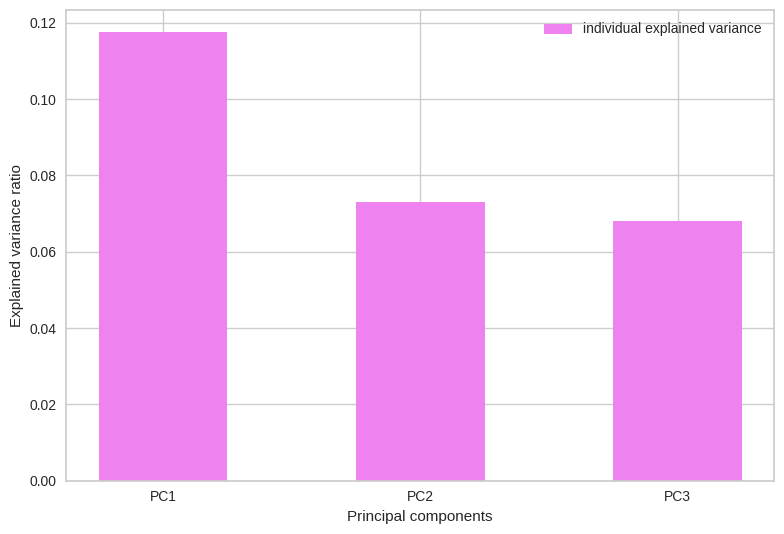

                                PC1       PC2       PC3
type                       0.862330  0.144664  0.119719
country                    0.089007 -0.388931 -0.141234
rating                     0.536352 -0.217855 -0.305353
duration                   0.729689  0.123456  0.233779
show_age                  -0.352890  0.133177  0.183290
Sci-Fi & Fantasy          -0.010606  0.026365  0.040450
Romance & Drama           -0.132538  0.716665 -0.164163
Horror & Suspense         -0.096002 -0.034771 -0.087644
Action & Adventure        -0.294021  0.194833  0.060992
Crime & Mystery            0.458655  0.210137  0.192209
Documentaries             -0.030984 -0.320365 -0.622193
Comedy & Stand-Up         -0.099115 -0.618013  0.677860
Sports & Fitness          -0.001531 -0.015396 -0.025543
International TV & Movies  0.156808  0.103862  0.095935
Reality & Talk Shows       0.275021  0.024412  0.044984
Other                      0.013758 -0.084303 -0.122895
Kids & Family              0.316653 -0.181421 -0

In [2154]:
# put your answer here
import matplotlib.pyplot as plt
import numpy as np
explained_variance = pca.explained_variance_ratio_

PC1_explainedvariance = explained_variance[0]
print("Explained variance of PC1", PC1_explainedvariance)

PC2_explainedvariance = explained_variance[1]
print("Explained variance of PC2", PC2_explainedvariance)

PC2_explainedvariance = explained_variance[2]
print("Explained variance of PC2", PC2_explainedvariance)
plt.figure()
principalcomponents = ['PC1', 'PC2', 'PC3']

plt.bar(principalcomponents, explained_variance, width=0.5, label='individual explained variance', color='violet')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal components')
plt.legend(loc='best')
plt.tight_layout()

plt.show()
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)

loading_matrix = pd.DataFrame(loadings, columns=['PC1', 'PC2', 'PC3'], index=scaled_ds.columns)

print(loading_matrix)

3. Use any clustering algorithm to create clusters

Elbow Method to determine the number of clusters to be formed:


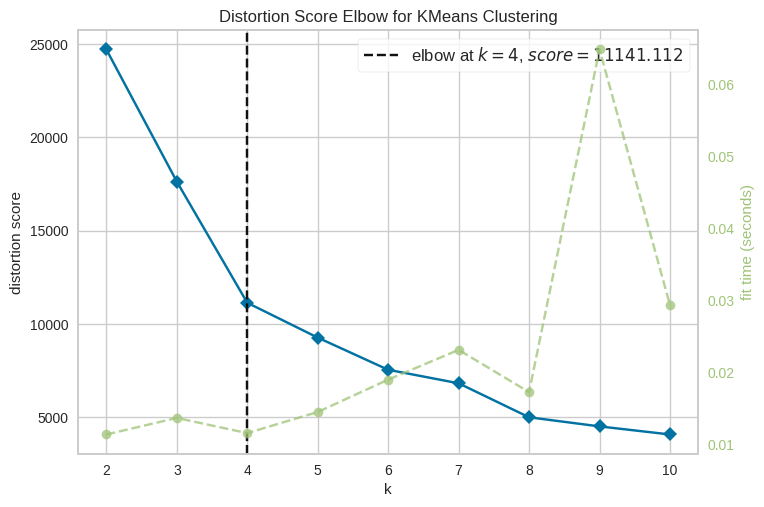

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [2155]:
# put your answer here
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans

pca = PCA(n_components=3)
PCA_ds = pd.DataFrame(pca.fit_transform(scaled_ds), columns=(["col1","col2", "col3"]))

print('Elbow Method to determine the number of clusters to be formed:')
Elbow_M = KElbowVisualizer(KMeans(), k=10)
Elbow_M.fit(PCA_ds)
Elbow_M.show()

In [2156]:
kmeans = KMeans(n_clusters = 4, random_state = 0, n_init='auto')
kmeans.fit(PCA_ds)
labels = kmeans.labels_
kmeans.inertia_

11140.852722659705

In [2157]:
print(PCA_ds.columns)

Index(['col1', 'col2', 'col3'], dtype='object')


In [2158]:
PCA_ds["Cluster"] = labels

4. Profile each cluster that you have generated based on your experiments

<Axes: xlabel='col1', ylabel='col2'>

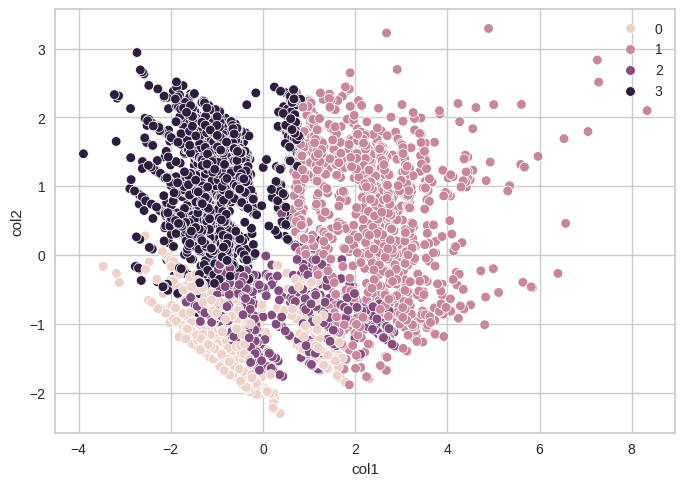

In [2159]:
# put your answer here
import seaborn as sns

sns.scatterplot(data = PCA_ds, x = 'col1', y = 'col2', hue = kmeans.labels_)

In [2160]:
from sklearn.metrics import silhouette_score

score = silhouette_score(PCA_ds[['col1', 'col2']], PCA_ds['Cluster'])
print(f"Silhouette Score: {score}")

Silhouette Score: 0.2936201800810548


In [2161]:

kmeans= KMeans(n_clusters=4, init='k-means++', random_state=42)
y_kmeans = kmeans.fit_predict(PCA_ds)
PCA_ds["Clusters"]= y_kmeans
df["Clusters"]= y_kmeans

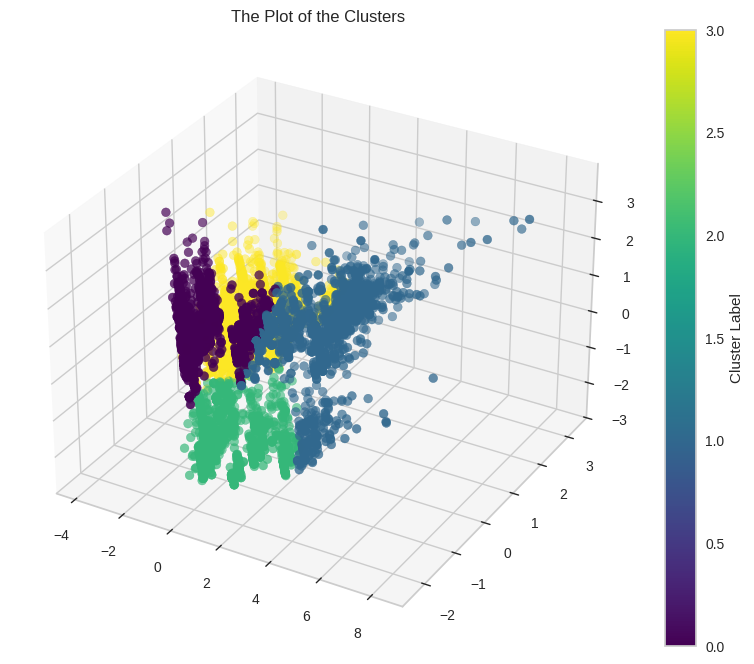

In [2162]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

x = PCA_ds["col1"]
y = PCA_ds["col2"]

cmap = plt.get_cmap("viridis")

fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(x, y, z, s=40, c=PCA_ds["Clusters"], marker='o', cmap=cmap)

plt.colorbar(scatter, label="Cluster Label")

ax.set_title("The Plot of the Clusters")
plt.show()

<ipython-input-2163-7db5fecdf4b8>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  pl = sns.countplot(x=df["Clusters"], palette= pal)


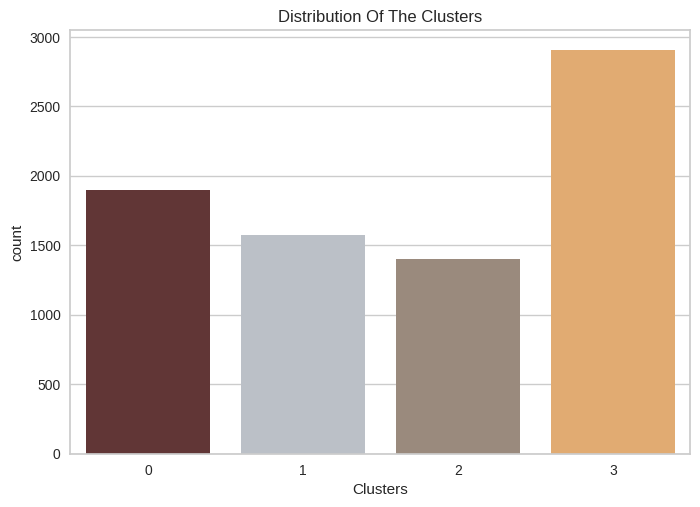

In [2163]:
pal = ["#682F2F","#B9C0C9", "#9F8A78","#F3AB60"]
pl = sns.countplot(x=df["Clusters"], palette= pal)
pl.set_title("Distribution Of The Clusters")
plt.show()

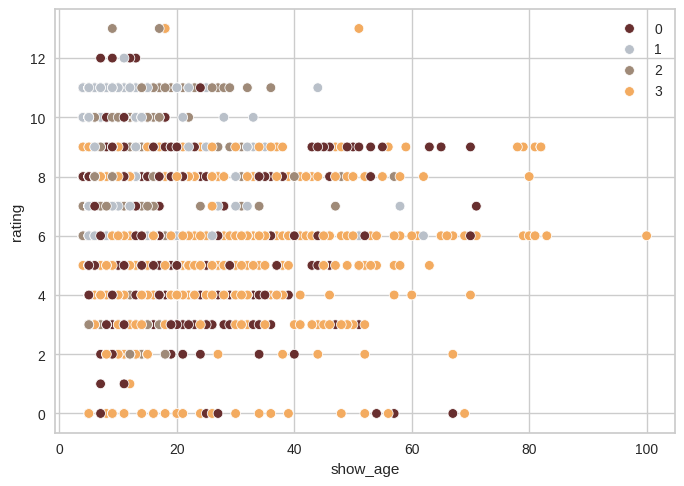

In [2164]:
pl = sns.scatterplot(data = df,x=df["show_age"], y=df["rating"],hue=df["Clusters"], palette= pal)
plt.legend()
plt.show()

In [2165]:
df

,type,country,rating,duration,show_age,Sci-Fi & Fantasy,Romance & Drama,Horror & Suspense,Action & Adventure,Crime & Mystery,Documentaries,Comedy & Stand-Up,Sports & Fitness,International TV & Movies,Reality & Talk Shows,Other,Kids & Family,Music & Performing Arts,Classic & Cult,Clusters
0,1,39,8,2400,5,True,False,False,False,False,False,False,False,False,False,False,False,False,False,1
1,0,308,8,93,9,False,True,False,False,False,False,False,False,False,False,False,False,False,False,3
2,0,379,5,78,14,False,False,True,False,False,False,False,False,False,False,False,False,False,False,3
3,0,549,4,80,16,False,False,False,True,False,False,False,False,False,False,False,False,False,False,3
4,0,549,4,123,17,False,True,False,False,False,False,False,False,False,False,False,False,False,False,3
5,1,448,8,600,9,False,False,False,False,True,False,False,False,False,False,False,False,False,False,1
6,0,137,8,95,6,False,False,True,False,False,False,False,False,False,False,False,False,False,False,3
7,0,549,5,119,28,False,True,False,False,False,False,False,False,False,False,False,False,False,False,3
8,0,229,6,118,6,False,False,True,False,False,False,False,False,False,False,False,False,False,False,3
9,0,229,8,143,17,False,False,False,True,False,False,False,False,False,False,False,False,False,False,3


/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:1883: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  func(x=self.x, ax=self.ax_marg_x, **kwargs)


<Figure size 800x550 with 0 Axes>

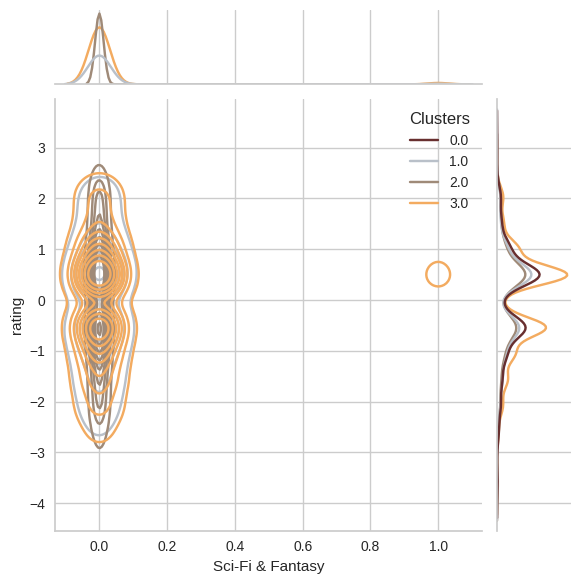

/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:1883: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  func(x=self.x, ax=self.ax_marg_x, **kwargs)


<Figure size 800x550 with 0 Axes>

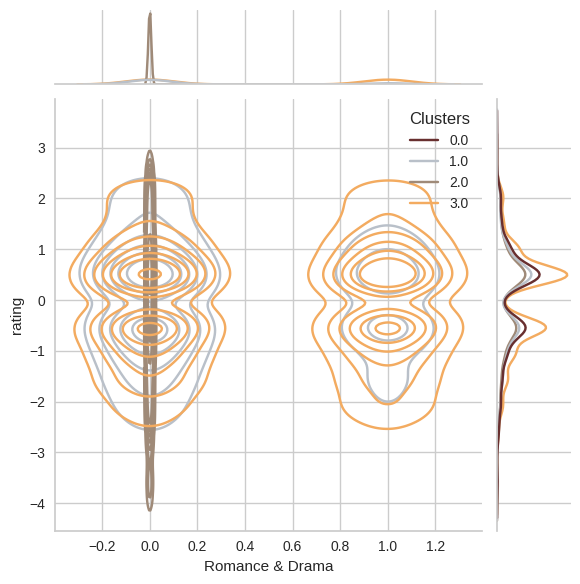

/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:1883: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  func(x=self.x, ax=self.ax_marg_x, **kwargs)


<Figure size 800x550 with 0 Axes>

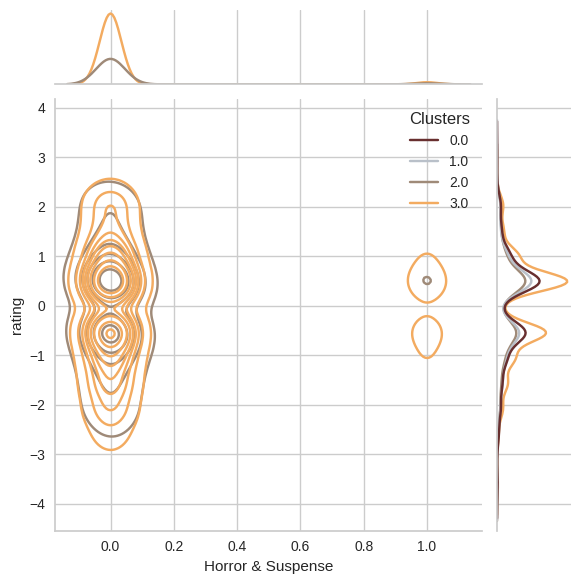

/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:1883: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  func(x=self.x, ax=self.ax_marg_x, **kwargs)


<Figure size 800x550 with 0 Axes>

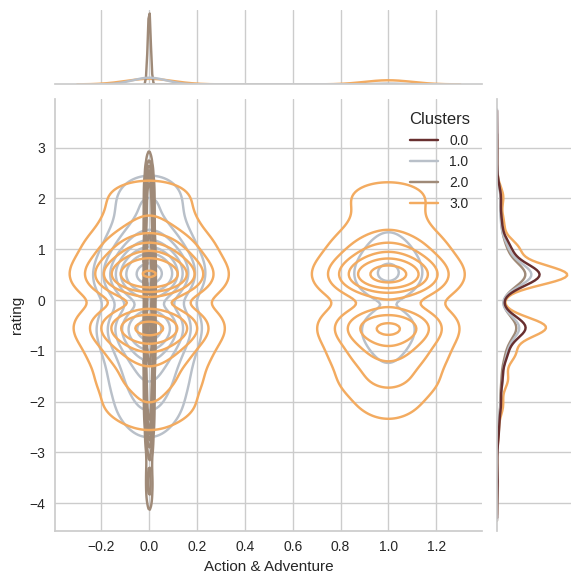

/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:1883: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  func(x=self.x, ax=self.ax_marg_x, **kwargs)


<Figure size 800x550 with 0 Axes>

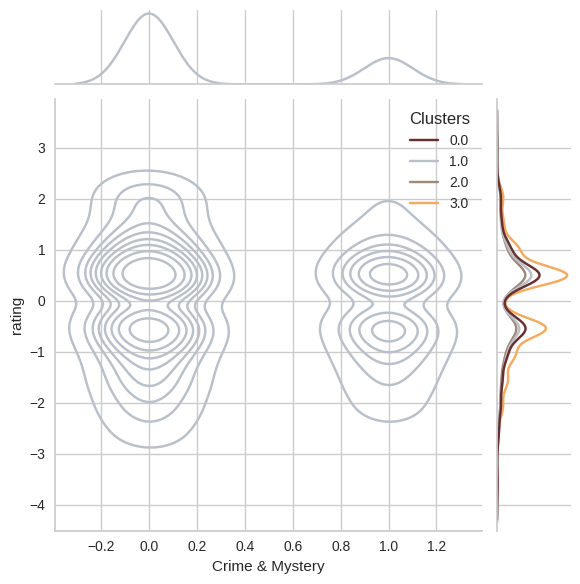

/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:1883: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  func(x=self.x, ax=self.ax_marg_x, **kwargs)


<Figure size 800x550 with 0 Axes>

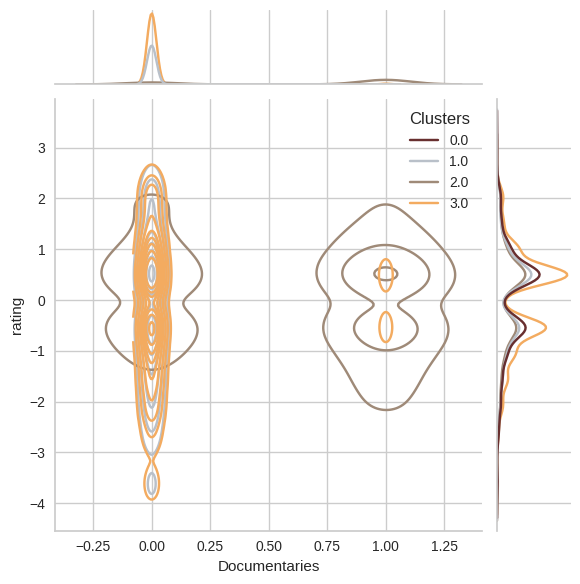

/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:1883: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  func(x=self.x, ax=self.ax_marg_x, **kwargs)


<Figure size 800x550 with 0 Axes>

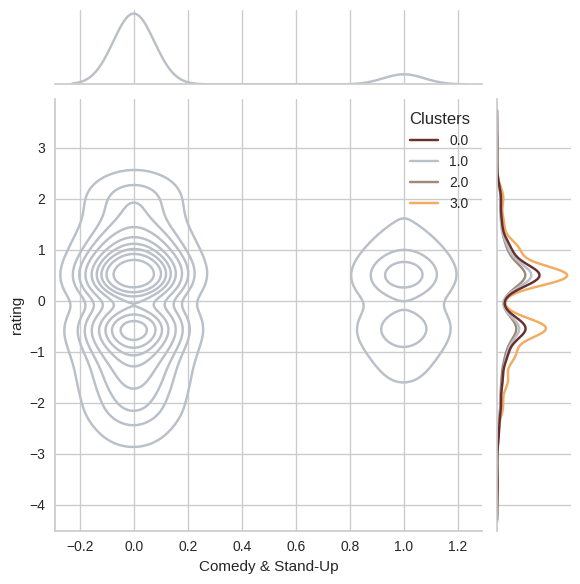

/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:1883: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  func(x=self.x, ax=self.ax_marg_x, **kwargs)


<Figure size 800x550 with 0 Axes>

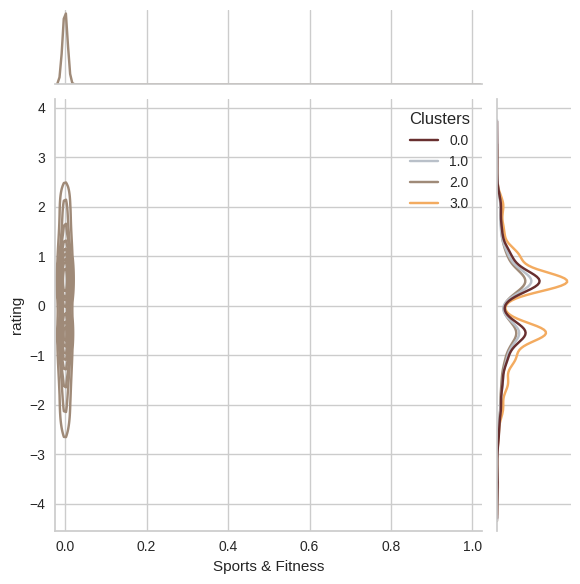

/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:1883: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  func(x=self.x, ax=self.ax_marg_x, **kwargs)


<Figure size 800x550 with 0 Axes>

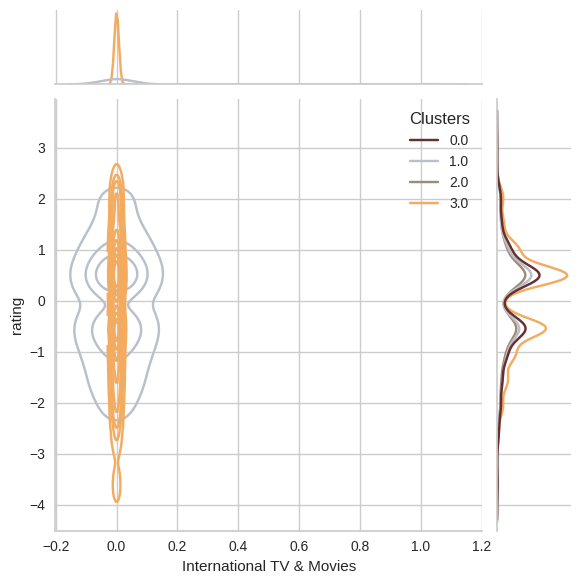

/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:1883: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  func(x=self.x, ax=self.ax_marg_x, **kwargs)


<Figure size 800x550 with 0 Axes>

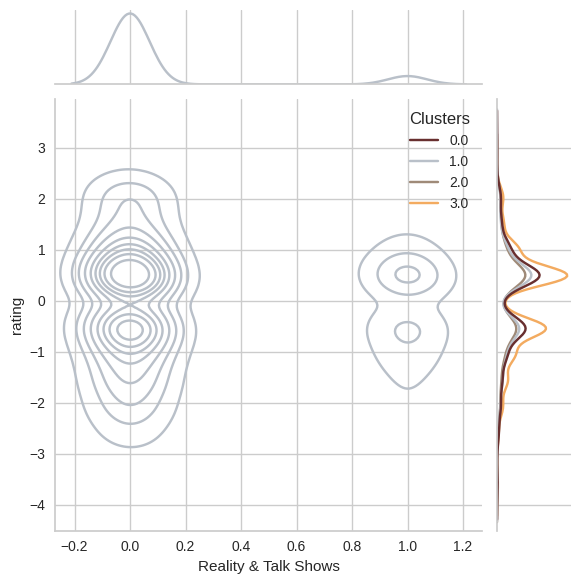

/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:1883: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  func(x=self.x, ax=self.ax_marg_x, **kwargs)


<Figure size 800x550 with 0 Axes>

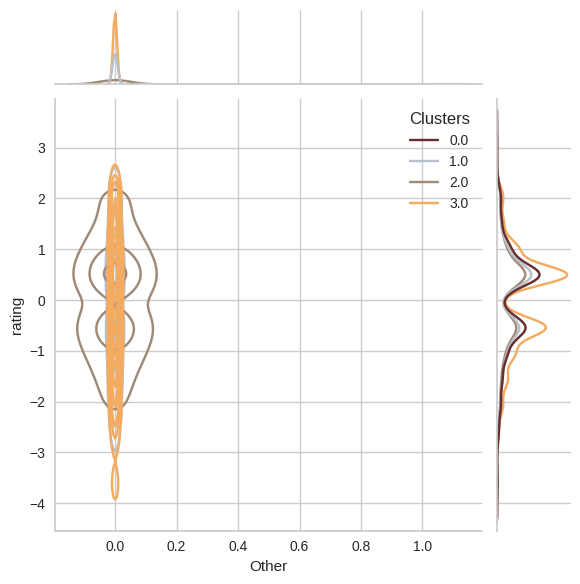

/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:1883: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  func(x=self.x, ax=self.ax_marg_x, **kwargs)


<Figure size 800x550 with 0 Axes>

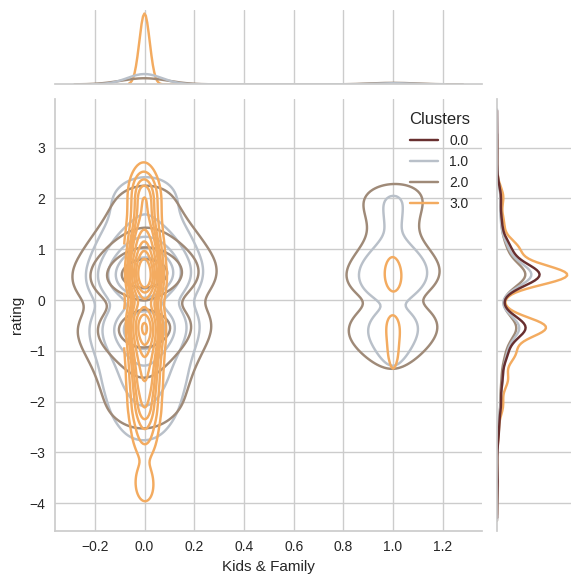

/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:1883: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  func(x=self.x, ax=self.ax_marg_x, **kwargs)


<Figure size 800x550 with 0 Axes>

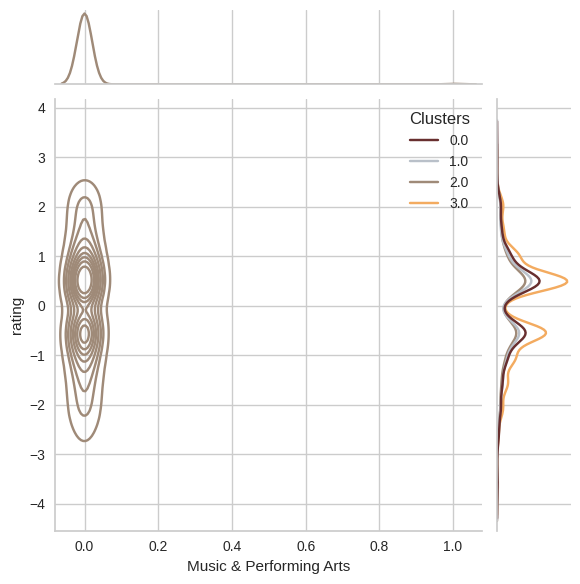

/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:1883: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  func(x=self.x, ax=self.ax_marg_x, **kwargs)


<Figure size 800x550 with 0 Axes>

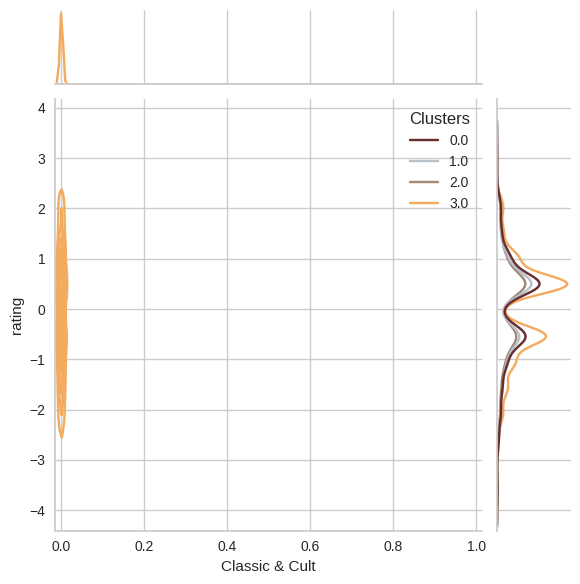

In [2166]:
category = ['Sci-Fi & Fantasy', 'Romance & Drama', 'Horror & Suspense',
 'Action & Adventure', 'Crime & Mystery', 'Documentaries',
 'Comedy & Stand-Up', 'Sports & Fitness', 'International TV & Movies',
 'Reality & Talk Shows', 'Other', 'Kids & Family', 'Music & Performing Arts',
 'Classic & Cult']

for i in category:
    plt.figure()
    sns.jointplot(x=df[i], y=scaled_ds["rating"], hue =df["Clusters"], kind="kde", palette=pal)
    plt.show()

Analysis

Cluster 0:

Characteristics: This cluster might contain shows with a high duration, possibly TV shows with multiple seasons.

Genres: Dominated by genres like "Sci-Fi & Fantasy" or "Action & Adventure".

Rating: Likely to have a higher rating (e.g., TV-MA).

Cluster 1:

Characteristics: This cluster might contain shorter content, possibly movies.

Genres: Dominated by genres like "Romance & Drama" or "Comedy & Stand-Up".

Rating: Likely to have a moderate rating (e.g., PG-13).

Cluster 2:

Characteristics: This cluster might contain international content.

Genres: Dominated by "International TV & Movies".

Rating: Could have a mix of ratings, but possibly more family-friendly content.

Cluster 3:

Characteristics: This cluster might contain documentaries or reality shows.

Genres: Dominated by "Documentaries" or "Reality & Talk Shows".

Rating: Likely to have a lower rating (e.g., TV-G or TV-PG).